## Final Assignment: Problem Formulation

For this project you work with real data from Airbnb with the goal is to explore the data and build a tool to get an estimate for a new listening in Stockholm. Imagine you have an apartment in Stockholm and would like to rent it out via Airbnb. What price should you set? Minimum nights per stay? What amenities do you need to stick out against the hard competition in Stockholm? What are important keywords in your title and description? These and many other questions are important to answer. With the provided data you can find an answer to the question.

 

The tool you create, should take an address, number of rooms and different amenities (dryer, oven, smoke alarm) as an input and provide the user with an estimate rental price per night. Additionally provide information how you would stick out against the competition.
Here the functionality of the tool is most important rather than a perfect designed user interface.

 

## Loading Libraries and Dataset

In [1]:
import pandas as pd  # For data manipulation and reading CSV files
import numpy as np   # For numerical operations
import matplotlib.pyplot as plt # For plotting graphs
import seaborn as sns # For enhanced data visualization
import io
import ast # For safely evaluating string representations of lists (like amenities)
from datetime import datetime # To handle date calculations
import pandas as pd
import warnings
warnings.filterwarnings('ignore') # ignore pandas FutureWarnings
import lightgbm as lgb
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from scipy.stats import uniform, randint
import re # Import the regular expression module
import plotly.express as px
import geopandas

from collections import Counter
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

# Import NLTK for stopwords and tokenization
# If you get errors related to missing resources, uncomment the lines below
# and run the script once to download them.
import nltk
# nltk.download('stopwords')
# nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize



# Set some display options for pandas DataFrames for better readability
pd.set_option('display.max_columns', None) 
pd.set_option('display.max_rows', 100)     
pd.set_option('display.float_format', lambda x: '%.3f' % x) 

print("Libraries imported successfully.")

Libraries imported successfully.


In [2]:
try:
    file_path = '../data/listings.csv' 

    # Load the dataset
    df_raw = pd.read_csv(file_path)
    df = df_raw.copy()

    print(f"Dataset loaded successfully from: {file_path}")
    print(f"Dataset shape (rows, columns): {df.shape}")

except FileNotFoundError:
    print(f"Error: The file was not found at the specified path: {file_path}")
    print("Please ensure the file path is correct.")
except Exception as e:
    print(f"An error occurred during data loading: {e}")

Dataset loaded successfully from: ../data/listings.csv
Dataset shape (rows, columns): (5223, 75)


## Initial Data Exploration

In [3]:
if 'df' in locals():
    print("\n--- Initial Data Exploration ---")

    # 1. Display the first few rows
    print("\n1. First 5 rows of the dataset:")
    display(df.head()) 

    # 2. Display concise summary of the DataFrame
    print("\n2. DataFrame Info (Column Types and Non-Null Counts):")
    df.info() 

    # 3. Display basic descriptive statistics for numerical columns
    print("\n3. Descriptive Statistics for Numerical Columns:")
    display(df.describe())

    # 4. Display basic descriptive statistics for object (text/categorical) columns
    print("\n4. Descriptive Statistics for Object/Categorical Columns:")
    display(df.describe(include='object'))

    # 5. Check for missing values (showing percentage)
    print("\n5. Percentage of Missing Values per Column (sorted):")
    missing_percentage = (df.isnull().sum() / len(df) * 100).sort_values(ascending=False)
    # Filter to show only columns with missing values
    missing_percentage = missing_percentage[missing_percentage > 0]
    if not missing_percentage.empty:
      print(missing_percentage)
    else:
      print("No missing values found.")


    # 6. Check the number of unique values in each column
    print("\n6. Number of Unique Values per Column:")
    unique_counts = df.nunique().sort_values()
    print(unique_counts)

    # 7. Quick check on the target variable 'price' if it exists
    if 'price' in df.columns:
        print("\n7. Initial check on the 'price' column:")
        print(f"   Data type: {df['price'].dtype}")
        # Show some example values if it's an object type (likely needs cleaning)
        if df['price'].dtype == 'object':
            print(f"   Example values: {df['price'].dropna().unique()[:10]}") 
        else:
             # If already numeric, show range
             print(f"   Min price: {df['price'].min()}, Max price: {df['price'].max()}")
    else:
        print("\nWarning: 'price' column not found in the dataset.")

else:
    print("\nSkipping Initial EDA because the DataFrame 'df' was not loaded.")


--- Initial Data Exploration ---

1. First 5 rows of the dataset:


,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,164448,https://www.airbnb.com/rooms/164448,20241230011645,2024-12-30,city scrape,Double room in central Stockholm with Wi-Fi,I am renting out a nice double room on the top...,NaN,https://a0.muscache.com/pictures/f56d8d10-a7fa...,784312,https://www.airbnb.com/users/show/784312,Li,2011-07-06,"Stockholm, Sweden","I am a recently retired lady, who has two room...",within an hour,100%,100%,t,https://a0.muscache.com/im/users/784312/profil...,https://a0.muscache.com/im/users/784312/profil...,Södermalm,2,2,"['email', 'phone']",t,t,NaN,Södermalms,NaN,59.314,18.061,Private room in rental unit,Private room,2,1.000,1 shared bath,1.000,2.000,"[""Hair dryer"", ""Hangers"", ""Long term stays all...",$944.00,2,120,2,2,120,120,2.000,120.000,NaN,t,27,57,87,177,2024-12-30,430,30,1,2011-07-30,2024-12-09,4.860,4.870,4.790,4.950,4.970,4.840,4.760,NaN,f,2,0,2,0,2.630
1,220851,https://www.airbnb.com/rooms/220851,20241230011645,2024-12-30,city scrape,One room in appartement,Welcome!,Many restaurangs wery close and walkingdistanc...,https://a0.muscache.com/pictures/2085606/7a706...,412283,https://www.airbnb.com/users/show/412283,Fredric,2011-02-27,"Stockholm, Sweden",I am into arts yoga meditation design life rel...,within a day,100%,15%,f,https://a0.muscache.com/im/pictures/user/e0c05...,https://a0.muscache.com/im/pictures/user/e0c05...,Kungsholmen,2,4,"['email', 'phone']",t,t,"Stockholm, Stockholm County, Sweden",Kungsholmens,NaN,59.334,18.037,Private room in rental unit,Private room,1,1.000,1 shared bath,1.000,1.000,"[""Hangers"", ""Apple sound system with aux"", ""P...",$414.00,2,20,2,2,20,20,2.000,20.000,NaN,t,25,55,85,360,2024-12-30,64,1,0,2011-09-29,2024-08-30,4.680,4.700,4.630,4.870,4.880,4.810,4.700,NaN,f,2,1,1,0,0.400
2,238411,https://www.airbnb.com/rooms/238411,20241230011645,2024-12-30,city scrape,Cozy apartment in central Stockholm,NaN,"Restaurants, cafés, museums, art galleries, pa...",https://a0.muscache.com/pictures/2806060/7fc68...,1250232,https://www.airbnb.com/users/show/1250232,Mia,2011-10-05,"Stockholm, Sweden",I am from Stockholm. I'm passionate about trav...,within a few hours,100%,0%,f,https://a0.muscache.com/im/users/1250232/profi...,https://a0.muscache.com/im/users/1250232/profi...,Norrmalm,1,1,"['email', 'phone']",t,t,"Stockholm, Stockholm County, Sweden",Norrmalms,NaN,59.339,18.051,Entire rental unit,Entire home/apt,2,1.000,1 bath,1.000,2.000,"[""Washer"", ""Hair dryer"", ""Hangers"", ""Long term...","$1,320.00",1,60,1,1,60,60,1.000,60.000,NaN,t,28,58,88,88,2024-12-30,110,0,0,2011-11-28,2016-12-13,4.790,4.650,4.710,4.850,4.950,4.850,4.640,NaN,f,1,1,0,0,0.690
3,242188,https://www.airbnb.com/rooms/242188,20241230011645,2024-1


2. DataFrame Info (Column Types and Non-Null Counts):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5223 entries, 0 to 5222
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            5223 non-null   int64  
 1   listing_url                                   5223 non-null   object 
 2   scrape_id                                     5223 non-null   int64  
 3   last_scraped                                  5223 non-null   object 
 4   source                                        5223 non-null   object 
 5   name                                          5223 non-null   object 
 6   description                                   5006 non-null   object 
 7   neighborhood_overview                         1901 non-null   object 
 8   picture_url                                   5223 non-null   object 
 9   host_id 

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,5223.000,5223.000,5223.000,5223.000,5223.000,0.000,5223.000,5223.000,5223.000,3496.000,4914.000,3495.000,5223.000,5223.000,5223.000,5223.000,5223.000,5223.000,5223.000,5223.000,0.000,5223.000,5223.000,5223.000,5223.000,5223.000,5223.000,5223.000,4160.000,4160.000,4160.000,4160.000,4160.000,4160.000,4160.000,0.000,5223.000,5223.000,5223.000,5223.000,4160.000
mean,615271881759993984.000,20241230011645.000,182750157.987,9.875,18.960,NaN,59.318,18.031,3.452,1.270,1.703,2.120,7.336,331.362,6.856,7.847,421.209,442.352,7.539,431.956,NaN,11.742,25.071,38.839,135.412,27.752,8.415,0.491,4.808,4.812,4.748,4.860,4.870,4.814,4.727,NaN,4.629,4.149,0.451,0.008,1.142
std,515664380057263488.000,1.723,192404576.228,90.592,249.012,NaN,0.031,0.065,1.946,0.625,1.171,1.745,26.294,378.695,25.314,26.817,435.793,516.378,26.379,437.043,NaN,12.347,25.238,38.116,135.456,65.706,21.831,1.544,0.359,0.356,0.405,0.329,0.326,0.307,0.383,NaN,11.033,11.049,1.699,0.132,2.286
min,164448.000,20241230011645.000,4457.000,1.000,1.000,NaN,59.232,17.773,1.000,0.000,0.000,0.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,NaN,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,NaN,1.000,0.000,0.000,0.000,0.010
25%,35777829.000,20241230011645.000,23243281.500,1.000,1.000,NaN,59.298,18.001,2.000,1.000,1.000,1.000,1.000,30.000,1.000,2.000,30.000,30.000,2.000,30.000,NaN,0.000,0.000,0.000,0.000,1.000,0.000,0.000,4.750,4.760,4.670,4.850,4.860,4.750,4.650,NaN,1.000,1.000,0.000,0.000,0.180
50%,801168019967339520.000,20241230011645.000,91345583.000,1.000,2.000,NaN,59.317,18.046,3.000,1.000,1.000,2.000,3.000,300.000,2.000,3.000,365.000,365.000,3.000,365.000,NaN,6.000,16.000,29.000,88.000,6.000,2.000,0.000,4.920,4.920,4.870,4.960,5.000,4.910,4.810,NaN,1.000,1.000,0.000,0.000,0.450
75%,1110622784882269440.000,20241230011645.000,325885492.000,2.000,3.000,NaN,59.338,18.076,4.000,1.500,2.000,3.000,5.000,365.000,4.000,5.000,999.000,1125.000,5.000,1039.300,NaN,26.000,55.000,83.000,268.000,22.000,7.000,0.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,NaN,2.000,1.000,0.000,0.000,1.220
max,1321949733901820416.000,20241230011645.000,669352745.000,3284.000,8065.000,NaN,59.419,18.188,16.000,12.000,12.000,26.000,500.000,1125.000,500.000,500.000,1125.000,20000.000,500.000,3051.000,NaN,30.000,60.000,90.000,365.000,1174.000,711.000,54.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,NaN,69.000,69.000,21.000,3.000,76.450



4. Descriptive Statistics for Object/Categorical Columns:


,listing_url,last_scraped,source,name,description,neighborhood_overview,picture_url,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,property_type,room_type,bathrooms_text,amenities,price,has_availability,calendar_last_scraped,first_review,last_review,instant_bookable
count,5223,5223,5223,5223,5006,1901,5223,5223,5223,5223,4269,2276,3071,3071,4147,5199,5223,5223,1485,5223,5223,5223,1901,5223,5223,5223,5214,5223,3498,5027,5223,4160,4160,5223
unique,5223,1,2,5068,4723,1672,5170,4172,1672,2592,123,1623,4,47,101,2,3968,3968,24,5,2,2,87,14,43,4,26,4920,1271,2,1,1848,883,2
top,https://www.airbnb.com/rooms/164448,2024-12-30,city scrape,Lägenhet Stockholm,Live the simple life in this peaceful and cent...,The apartment Is located in the heart of Stock...,https://a0.muscache.com/pictures/miso/Hosting-...,https://www.airbnb.com/users/show/271346174,Anna,2019-06-25,"Stockholm, Sweden",Born and raised in Stockholm and work as a pro...,within an hour,100%,100%,f,https://a0.muscache.com/defaults/user_pic-50x5...,https://a0.muscache.com/defaults/user_pic-225x...,Södermalm,"['email', 'phone']",t,t,"Stockholm, Stockholms län, Sweden",Södermalms,Entire rental unit,Entire home/apt,1 bath,"[""Washer"", ""TV"", ""Kitchen"", ""Wifi"", ""Smoke ala...","$2,500.00",t,2024-12-30,2024-05-19,2024-12-15,f
freq,1,5223,3498,23,23,34,6,69,97,69,3923,49,1686,2193,1058,4263,217,217,549,3989,5006,4612,406,1317,2947,4316,3048,28,91,5022,5223,72,114,4512



5. Percentage of Missing Values per Column (sorted):
neighbourhood_group_cleansed   100.000
license                        100.000
calendar_updated               100.000
host_neighbourhood              71.568
neighborhood_overview           63.603
neighbourhood                   63.603
host_about                      56.424
host_response_rate              41.202
host_response_time              41.202
beds                            33.084
bathrooms                       33.065
price                           33.027
host_acceptance_rate            20.601
reviews_per_month               20.352
last_review                     20.352
review_scores_rating            20.352
review_scores_accuracy          20.352
review_scores_cleanliness       20.352
review_scores_checkin           20.352
review_scores_communication     20.352
review_scores_location          20.352
review_scores_value             20.352
first_review                    20.352
host_location                   18.265
bedrooms  

## Data Preprocessing

In [4]:
# Make sure 'df' DataFrame exists from the previous steps
if 'df' not in locals():
    print("Error: DataFrame 'df' not found. Please run the data loading step first.")
else:
    print(f"Starting cleaning process on DataFrame with shape: {df.shape}")
    

    # --- 1. Drop Unnecessary or Redundant Columns ---
    # Based on EDA: 100% missing, IDs, URLs, free text (for now), metadata, redundant cols

    columns_to_drop = [
        # 100% Missing
        'neighbourhood_group_cleansed', 'license', 'calendar_updated',
        # IDs / URLs / Metadata
        'listing_url', 'scrape_id', 'last_scraped', 'source', 'picture_url',
        'host_id', 'host_url', 'host_name', 'host_thumbnail_url', 'host_picture_url',
        'calendar_last_scraped',
        # Free text (can revisit later for NLP if needed)
        'neighborhood_overview', 'host_about',
        # Redundant / High Missing % / Less Useful Location info
        'neighbourhood', # Using neighbourhood_cleansed
        'host_neighbourhood', # Very high missing %
        'has_availability' # not useful to know wheter the apt was available when data was collected
        # Redundant host counts (keeping host_total_listings_count and calculated_host_listings_count)
        'host_listings_count',
        'calculated_host_listings_count_entire_homes',
        'calculated_host_listings_count_private_rooms',
        'calculated_host_listings_count_shared_rooms',
        # Redundant nights variables (keeping minimum_nights, maximum_nights)
        'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights',
        'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm',
        # Redundant review counts (keeping number_of_reviews, reviews_per_month)
        'number_of_reviews_ltm', 'number_of_reviews_l30d',
        # Redundant/Less useful bathrooms col (will parse bathrooms_text)
        'bathrooms'
    ]

    # Drop the columns, using errors='ignore' in case some columns were already dropped or don't exist
    df.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    print(f"Dropped {len(columns_to_drop)} columns. New shape: {df.shape}")

    # --- 2. Clean Target Variable ('price') ---
    # Convert price from object (string with $ and ,) to float
    # Also drop rows where price is missing, as they cannot be used for training/evaluation

    if 'price' in df.columns:
        # Drop rows where price is NaN *before* attempting conversion
        original_rows = df.shape[0]
        df.dropna(subset=['price'], inplace=True)
        print(f"Dropped {original_rows - df.shape[0]} rows with missing 'price'. New shape: {df.shape}")

        # Clean the price string and convert to float
        try:
            df['price'] = df['price'].astype(str).str.replace(r'[$,]', '', regex=True).astype(float)
            print("Cleaned 'price' column: removed '$', ',', and converted to float.")
            # Display stats for the cleaned price
            print("\nDescriptive statistics for cleaned 'price':")
            display(df['price'].describe())
        except Exception as e:
            print(f"Error cleaning 'price' column: {e}")
    else:
        print("Warning: 'price' column not found, skipping price cleaning.")


    # --- 3. Convert Boolean-like Columns ('t'/'f') to Binary (1/0) ---
    bool_cols = ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'instant_bookable']

    for col in bool_cols:
        if col in df.columns:
            # Impute potential NaNs with the mode (most frequent value, likely 'f') before mapping
            mode_val = df[col].mode()[0]
            df[col].fillna(mode_val, inplace=True)
            # Map 't' to 1 and 'f' to 0
            df[col] = np.where(df[col] == 't', 1, 0)
            print(f"Converted '{col}' to binary (1/0).")

    print(f"Converted boolean-like columns {bool_cols} to binary (1/0).")

    # --- 4. Clean and Convert Percentage Columns ---
    # host_response_rate, host_acceptance_rate
    percent_cols = ['host_response_rate', 'host_acceptance_rate']
    for col in percent_cols:
        if col in df.columns:
            # Convert to string, remove '%', convert to float, divide by 100
            df[col] = df[col].astype(str).str.replace('%', '', regex=False).astype(float) / 100.0
            # Missing values will be handled later (imputation)
            print(f"Cleaned and converted '{col}' to float (0-1 scale).") 

    print(f"Cleaned percentage columns {percent_cols} (converted to 0-1 float scale).")


    # --- 5. Convert Date Columns and Engineer Host Duration ---
    date_cols = ['host_since', 'first_review', 'last_review']
    current_time = datetime.now() # Use current time for calculations like host duration

    for col in date_cols:
        if col in df.columns:
            # Convert to datetime objects, coercing errors will turn unparseable dates into NaT (Not a Time)
            df[col] = pd.to_datetime(df[col], errors='coerce')
            print(f"Converted '{col}' to datetime objects.")

    # Engineer host_duration_days
    if 'host_since' in df.columns and pd.api.types.is_datetime64_any_dtype(df['host_since']):
        df['host_duration_days'] = (current_time - df['host_since']).dt.days
        # Handle potential NaT in host_since (which result in NaT in duration) - imputation later
        print("Engineered 'host_duration_days' feature.")
    else:
         print("Could not engineer 'host_duration_days': 'host_since' column missing or not datetime.")

    print(f"Converted date columns {date_cols} to datetime objects.")


    # --- 6. Parse 'bathrooms_text' ---
    # Extract number of baths and type (shared/private)

    if 'bathrooms_text' in df.columns:
        # Fill the few missing values with the mode
        mode_bath_text = df['bathrooms_text'].mode()[0]
        df['bathrooms_text'].fillna(mode_bath_text, inplace=True)
        print(f"Imputed {df['bathrooms_text'].isnull().sum()} missing values in 'bathrooms_text' with mode ('{mode_bath_text}').") # Should be 0 now

        # Extract number of baths (handles floats like 1.5, half-bath as 0.5)
        df['num_bathrooms'] = df['bathrooms_text'].str.extract(r'(\d+\.?\d*)').astype(float)
        # Handle 'Half-bath' specifically if the regex didn't catch it properly or if represented differently
        df['num_bathrooms'] = df['num_bathrooms'].fillna(0.5).where(df['bathrooms_text'].str.contains('Half-bath', case=False, na=False), df['num_bathrooms'])
        # Default to 1 bath if extraction failed and it's not a half-bath (e.g., just 'Private bath')
        df['num_bathrooms'].fillna(1.0, inplace=True)


        # Extract bath type (shared/private) - create a binary flag 'is_shared_bath'
        df['is_shared_bath'] = df['bathrooms_text'].str.contains('shared', case=False, na=False).astype(int)

        print("Parsed 'bathrooms_text': created 'num_bathrooms' (float) and 'is_shared_bath' (binary).")
        # Can drop the original column now
        df.drop(columns=['bathrooms_text'], inplace=True, errors='ignore')

    else:
        print("Warning: 'bathrooms_text' column not found, skipping parsing.")


    # --- 7. Parse 'amenities' ---
    # Convert string representation of list into actual list, then count amenities

    if 'amenities' in df.columns:
        # Function to safely parse the string representation of a list
        def parse_stringified_list(s):
            try:
                # Handle empty lists "[]" or potential variations
                if isinstance(s, str) and s.strip() and s.strip() != '[]':
                    # ast.literal_eval is safer than eval()
                    parsed_list = ast.literal_eval(s)
                    return parsed_list if isinstance(parsed_list, list) else []
                else:
                    return []
            except (ValueError, SyntaxError):
                # Return empty list if parsing fails
                return []

        df['amenities_list'] = df['amenities'].apply(parse_stringified_list)
        df['num_amenities'] = df['amenities_list'].apply(len)

        print("Parsed 'amenities': created 'amenities_list' and 'num_amenities'.")
        # Keep 'amenities_list' for potential multi-hot encoding later
        # Drop the original raw 'amenities' string column
        df.drop(columns=['amenities'], inplace=True, errors='ignore')
    else:
        print("Warning: 'amenities' column not found, skipping parsing.")


    # --- 8. Parse 'host_verifications' ---
    if 'host_verifications' in df.columns:
        # Use the same parsing function as for amenities
        df['verifications_list'] = df['host_verifications'].apply(parse_stringified_list)
        df['num_host_verifications'] = df['verifications_list'].apply(len)

        print("Parsed 'host_verifications': created 'verifications_list' and 'num_host_verifications'.")
        # Keep 'verifications_list' for potential feature engineering if needed
        # Drop the original raw 'host_verifications' string column
        df.drop(columns=['host_verifications'], inplace=True, errors='ignore')
    else:
         print("Warning: 'host_verifications' column not found, skipping parsing.")


    # --- 9. Handle Remaining Missing Values (Imputation) ---
    print("\n--- Handling Remaining Missing Values ---")

    # Strategy:
    # - Numerical: Impute with median (robust to outliers) or 0 where it makes sense (reviews).
    # - Categorical: Impute with a specific category like 'Unknown'.
    # - Datetime: Leave as NaT for now, or impute derived features (like duration).

    # Numerical Imputation
    num_cols_to_impute = {
        'host_response_rate': df['host_response_rate'].median(),
        'host_acceptance_rate': df['host_acceptance_rate'].median(),
        'bedrooms': df['bedrooms'].median(),
        'beds': df['beds'].median(), # High missing %, median is a simple start
        'host_duration_days': df['host_duration_days'].median(), # If host_since was missing
        # Review-related columns: Impute with 0 where number_of_reviews is 0
        'review_scores_rating': 0, 'review_scores_accuracy': 0, 'review_scores_cleanliness': 0,
        'review_scores_checkin': 0, 'review_scores_communication': 0, 'review_scores_location': 0,
        'review_scores_value': 0, 'reviews_per_month': 0
    }

    for col, fill_value in num_cols_to_impute.items():
        if col in df.columns:
            original_nan_count = df[col].isnull().sum()
            if original_nan_count > 0:
                # Special handling for review scores/reviews per month: only impute if number_of_reviews > 0?
                # Simpler approach: Impute all NaNs first. If col is reviews_per_month or review_scores*, impute with 0.
                if col.startswith('review_scores_') or col == 'reviews_per_month':
                     df[col].fillna(0, inplace=True)
                     print(f"Imputed {original_nan_count} missing values in '{col}' with 0.")
                else:
                    df[col].fillna(fill_value, inplace=True)
                    print(f"Imputed {original_nan_count} missing values in '{col}' with median ({fill_value:.3f}).")

    # Categorical Imputation
    cat_cols_to_impute = {
        'host_response_time': 'Unknown', # Create a new category
        'host_location': 'Unknown'     # Create a new category
    }
    for col, fill_value in cat_cols_to_impute.items():
         if col in df.columns:
            original_nan_count = df[col].isnull().sum()
            if original_nan_count > 0:
                df[col].fillna(fill_value, inplace=True)
                print(f"Imputed {original_nan_count} missing values in '{col}' with '{fill_value}'.")

    
    # --- 10. Final Check ---
    print("\n--- Final Check after Cleaning and Preprocessing ---")

    print("\n1. Remaining Missing Values per Column:")
    final_missing = df.isnull().sum()
    final_missing = final_missing[final_missing > 0]
    if not final_missing.empty:
        print(final_missing)
    else:
        print("No remaining missing values found (excluding potential NaTs in datetime columns).")

    print("\n2. DataFrame Info after Cleaning:")
    buffer = io.StringIO()
    df.info(buf=buffer, verbose=True)
    info_str = buffer.getvalue()
    print(info_str)

    print("\n3. First 5 rows of the cleaned DataFrame:")
    display(df.head())

    print("\nData cleaning and preprocessing step completed.")

Starting cleaning process on DataFrame with shape: (5223, 75)
Dropped 31 columns. New shape: (5223, 45)
Dropped 1725 rows with missing 'price'. New shape: (3498, 45)
Cleaned 'price' column: removed '$', ',', and converted to float.

Descriptive statistics for cleaned 'price':


count     3498.000
mean      2140.879
std      10108.348
min        105.000
25%        838.250
50%       1300.000
75%       2181.000
max     500000.000
Name: price, dtype: float64

Converted 'host_is_superhost' to binary (1/0).
Converted 'host_has_profile_pic' to binary (1/0).
Converted 'host_identity_verified' to binary (1/0).
Converted 'instant_bookable' to binary (1/0).
Converted boolean-like columns ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'instant_bookable'] to binary (1/0).
Cleaned and converted 'host_response_rate' to float (0-1 scale).
Cleaned and converted 'host_acceptance_rate' to float (0-1 scale).
Cleaned percentage columns ['host_response_rate', 'host_acceptance_rate'] (converted to 0-1 float scale).
Converted 'host_since' to datetime objects.
Converted 'first_review' to datetime objects.
Converted 'last_review' to datetime objects.
Engineered 'host_duration_days' feature.
Converted date columns ['host_since', 'first_review', 'last_review'] to datetime objects.
Imputed 0 missing values in 'bathrooms_text' with mode ('1 bath').
Parsed 'bathrooms_text': created 'num_bathrooms' (float) and 'is_shared_bath' (binary).
Parsed

,id,name,description,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,reviews_per_month,host_duration_days,num_bathrooms,is_shared_bath,amenities_list,num_amenities,verifications_list,num_host_verifications
0,164448,Double room in central Stockholm with Wi-Fi,I am renting out a nice double room on the top...,2011-07-06,"Stockholm, Sweden",within an hour,1.000,1.000,1,2,2,1,1,Södermalms,59.314,18.061,Private room in rental unit,Private room,2,1.000,2.000,944.000,2,120,t,27,57,87,177,430,2011-07-30,2024-12-09,4.860,4.870,4.790,4.950,4.970,4.840,4.760,0,2,2.630,5073,1.000,1,"[Hair dryer, Hangers, Long term stays allowed,...",29,"[email, phone]",2
1,220851,One room in appartement,Welcome!,2011-02-27,"Stockholm, Sweden",within a day,1.000,0.150,0,2,4,1,1,Kungsholmens,59.334,18.037,Private room in rental unit,Private room,1,1.000,1.000,414.000,2,20,t,25,55,85,360,64,2011-09-29,2024-08-30,4.680,4.700,4.630,4.870,4.880,4.810,4.700,0,2,0.400,5202,1.000,1,"[Hangers, Apple sound system with aux, Privat...",26,"[email, phone]",2
2,238411,Cozy apartment in central Stockholm,NaN,2011-10-05,"Stockholm, Sweden",within a few hours,1.000,0.000,0,1,1,1,1,Norrmalms,59.339,18.051,Entire rental unit,Entire home/apt,2,1.000,2.000,1320.000,1,60,t,28,58,88,88,110,2011-11-28,2016-12-13,4.790,4.650,4.710,4.850,4.950,4.850,4.640,0,1,0.690,4982,1.000,0,"[Washer, Hair dryer, Hangers, Long term stays ...",29,"[email, phone]",2
3,242188,Single room in central Stockholm with Wi-Fi,I am renting out a nice single room on the top...,2011-07-06,"Stockholm, Sweden",within an hour,1.000,1.000,1,2,2,1,1,Södermalms,59.312,18.061,Private room in rental unit,Private room,1,1.000,1.000,814.000,2,300,t,30,60,90,180,414,2012-02-13,2024-12-01,4.900,4.880,4.840,4.960,4.980,4.890,4.840,0,2,2.640,5073,1.000,1,"[Hair dryer, Hangers, Fast wifi – 283 Mbps, Ho...",27,"[email, phone]",2
4,273906,Penthouse in central Stockholm,NaN,2011-11-22,"Stockholm, Sweden",within a few hours,1.000,1.000,0,3,3,1,1,Södermalms,59.305,18.108,Entire rental unit,Entire home/apt,4,3.000,3.000,2750.000,6,30,t,2,2,2,9,4,2012-07-19,2017-07-31,5.000,5.000,5.000,5.000,4.750,5.000,5.000,0,2,0.030,4934,2.000,0,"[Washer, TV with standard cable, Dedicated wor...",8,"[email, phone, work_email]",3



Data cleaning and preprocessing step completed.


In [5]:
# Handling columns that still have null-values

# 1. We create a column to tell if a listing was never reviewd. We can get it from the number of reviews. This might be important
# to determine the price of new listings, and to see how it impacts prices of current listings
df['never_reviewed'] = (df['number_of_reviews'] == 0).astype(int)

reference_date = df['last_review'].max() # last observed revew in the dataset

# Days since last review: could be interesting for the regression to tell ho recent the last visit was to a listing
df['days_since_last_review'] = (reference_date - df['last_review']).dt.days

# Days since first review: it might be important to determine how "historically" this listing was. 
df['days_since_first_review'] = (reference_date - df['first_review']).dt.days

max_last = df['days_since_last_review'].max()
df['days_since_last_review'].fillna(max_last, inplace=True) # if a listing doesn't have any review, we put the max value here
df['days_since_first_review'].fillna(0, inplace=True) # if it was null, we put 0 
# these settings will likely be the same when trying to predict the price of NEW listings

# later usage in text analysis, but will remove for model training. 
name_col = df['name'].copy()
description_col = df['description'].copy()

df.drop(columns=['first_review', 'last_review', 'name', 'description'], inplace=True) # no loonger needed after new columns 

# Now we check again the dataset after these additional operations
print("\nDataFrame Info after (additional) Cleaning and Manipulation:")
buffer = io.StringIO()
df.info(buf=buffer, verbose=True)
info_str = buffer.getvalue()
print(info_str)




DataFrame Info after (additional) Cleaning and Manipulation:
<class 'pandas.core.frame.DataFrame'>
Index: 3498 entries, 0 to 5222
Data columns (total 48 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              3498 non-null   int64         
 1   host_since                      3498 non-null   datetime64[ns]
 2   host_location                   3498 non-null   object        
 3   host_response_time              3498 non-null   object        
 4   host_response_rate              3498 non-null   float64       
 5   host_acceptance_rate            3498 non-null   float64       
 6   host_is_superhost               3498 non-null   int32         
 7   host_listings_count             3498 non-null   int64         
 8   host_total_listings_count       3498 non-null   int64         
 9   host_has_profile_pic            3498 non-null   int32         
 10  host_identity_v

## Integration With Previous Model for Sentiment Analysis

In [6]:
import tensorflow as tf
from transformers import DistilBertTokenizerFast
from transformers import TFDistilBertModel


print("--- Sentiment Analysis on Listings (Name + Description) ---")

# --- 1. Load the Tokenizer ---
# Ensure you use the same tokenizer that was used during model training
print("Loading DistilBertTokenizerFast...")
try:
    tokenizer = DistilBertTokenizerFast.from_pretrained('distilbert-base-uncased')
    print("Tokenizer loaded successfully.")
except Exception as e:
    print(f"Error loading tokenizer: {e}")
    print("Please ensure you have an internet connection or the tokenizer is cached.")
    # Exit or raise an error if tokenizer cannot be loaded, as it's critical
    raise

# --- 2. Load the Pre-trained Keras Model ---
model_path = '../models/distilbert_bilstm_airbnb_finetuned.keras'
print(f"Loading Keras model from: {model_path}...")
try:
     # Load the model, providing the custom layer class definition
    loaded_sentiment_model = tf.keras.models.load_model(
        model_path,
        custom_objects={'TFDistilBertModel': TFDistilBertModel} 
    )

    print("Model loaded successfully using custom_objects.")
    # Verify the model structure
    loaded_sentiment_model.summary()
except Exception as e:
    print(f"Error loading sentiment model: {e}")
    print("Please ensure the model file exists at the specified path and TensorFlow/Keras can load it.")
    raise

# --- 3. Prepare the Text Data ---
print("\nPreparing text for sentiment prediction...")

# Combine 'name_col' and 'description_col'
# Fill NaN values with empty strings before concatenation
combined_text_series = name_col.fillna('') + ' ' + description_col.fillna('')

# Identify listings that had entirely empty name AND description initially
# These will receive a default score of 0.5
empty_text_mask = (name_col.isnull() | (name_col == '')) & \
                  (description_col.isnull() | (description_col == ''))
empty_listing_indices = combined_text_series[empty_text_mask].index

# Filter out empty texts for tokenization and prediction
# This avoids processing empty strings through the model, which can sometimes cause issues
# and we've already decided their default score.
text_for_prediction = combined_text_series[~empty_text_mask]

if text_for_prediction.empty:
    print("No non-empty texts to predict sentiment for. Assigning 0.5 to all.")
    df['desc_sentiment'] = 0.5
else:
    # Tokenize the combined text
    # Using the same MAX_LEN and BATCH_SIZE as during model training (defined in your create_distilbert_model cell)
    MAX_LEN = 256 # Ensure this matches your model's input length
    BATCH_SIZE = 16 # Ensure this matches your desired batch size for prediction

    print(f"Tokenizing {len(text_for_prediction)} non-empty texts (MAX_LEN={MAX_LEN}, BATCH_SIZE={BATCH_SIZE})...")
    # Using batch_encode_plus for efficient tokenization
    encoded_inputs = tokenizer.batch_encode_plus(
        text_for_prediction.tolist(), # Convert Series to list of strings
        max_length=MAX_LEN,
        truncation=True,
        padding='max_length',
        return_tensors='tf' # Return TensorFlow tensors
    )
    print("Tokenization complete.")

    # Create a TensorFlow Dataset for efficient prediction
    tf_dataset = tf.data.Dataset.from_tensor_slices({
        'input_ids': encoded_inputs['input_ids'],
        'attention_mask': encoded_inputs['attention_mask']
    }).batch(BATCH_SIZE)

    # --- 4. Make Predictions ---
    print("Making sentiment predictions...")
    sentiment_predictions = loaded_sentiment_model.predict(tf_dataset, verbose=1)
    print("Predictions complete.")

    # Predictions will be a NumPy array, usually of shape (num_samples, 1)
    # Flatten it to (num_samples,)
    sentiment_scores_array = sentiment_predictions.flatten()

    # --- 5. Assign Scores to DataFrame ---
    print("Assigning sentiment scores to 'desc_sentiment' column...")
    # Initialize the new column with NaN or a default if preferred
    df['desc_sentiment'] = np.nan

    # Map the predicted scores back to the original DataFrame using the indices
    df.loc[text_for_prediction.index, 'desc_sentiment'] = sentiment_scores_array

    # Assign 0.5 to listings where name and description were empty
    if not empty_listing_indices.empty:
        df.loc[empty_listing_indices, 'desc_sentiment'] = 0.5
        print(f"Assigned 0.5 to {len(empty_listing_indices)} listings with empty name/description.")
    else:
        print("No listings found with entirely empty name/description to default to 0.5.")

print("\n'desc_sentiment' column created successfully.")
print("Sample of 'desc_sentiment' column:")
print(df['desc_sentiment'].head())
print("\nDescriptive statistics for 'desc_sentiment':")
print(df['desc_sentiment'].describe())

--- Sentiment Analysis on Listings (Name + Description) ---
Loading DistilBertTokenizerFast...
Tokenizer loaded successfully.
Loading Keras model from: ../models/distilbert_bilstm_airbnb_finetuned.keras...
Model loaded successfully using custom_objects.
Model: "DistilBERT_BiLSTM_Classifier"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_ids (InputLayer)          [(None, 256)]        0                                            
__________________________________________________________________________________________________
attention_mask (InputLayer)     [(None, 256)]        0                                            
__________________________________________________________________________________________________
tf_distil_bert_model (TFDistilB TFBaseModelOutput(la 66362880    input_ids[0][0]                  
               

## Dataset backup after processing

In [7]:
# Save processed dataset
df.to_csv('listings_clean.csv', index=False)
print("Dataset saved in 'listings_clean.csv'")


Dataset saved in 'listings_clean.csv'


In [8]:
# Check if the DataFrame 'df' is already in memory
# If not, load it from the saved CSV file
if 'df' not in globals():            
    try:
        df = pd.read_csv('listings_clean.csv')
        print("Dataset loaded from 'listings_clean.csv'")
    except FileNotFoundError:
        raise FileNotFoundError("File 'listings_clean.csv' not found.")
else:
    print("'df' is already in memory, we are good to go!")


'df' is already in memory, we are good to go!


## Analysis of Correlation

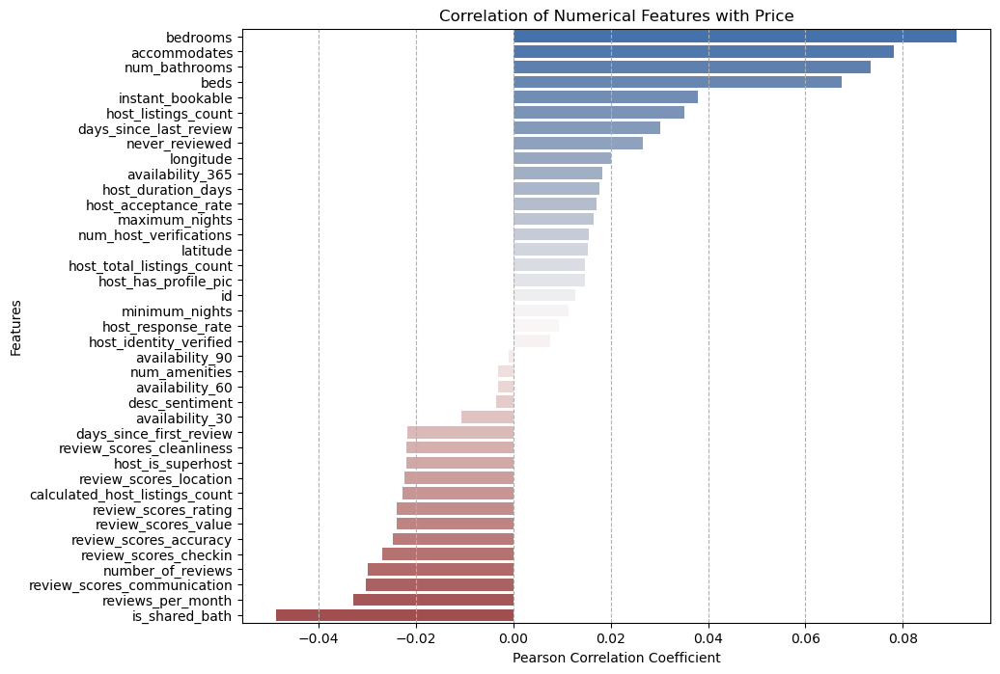

In [9]:
df_numeric_for_corr_with_price = df.select_dtypes(include=np.number)
cols_to_drop_corr = ['id']
df_numeric_for_corr_with_price.drop(columns=cols_to_drop_corr)

if 'price' in df_numeric_for_corr_with_price.columns and len(df_numeric_for_corr_with_price.columns) > 1:
    # Calculate correlations with the 'price' column
    price_correlations = df_numeric_for_corr_with_price.corr()['price'].sort_values(ascending=False)
    
    # Remove the self-correlation of 'price' with itself (which is 1)
    price_correlations = price_correlations.drop('price', errors='ignore')
    
    plt.figure(figsize=(10, 8))
    sns.barplot(x=price_correlations.values, y=price_correlations.index, palette="vlag")
    plt.title('Correlation of Numerical Features with Price')
    plt.xlabel('Pearson Correlation Coefficient')
    plt.ylabel('Features')
    plt.grid(axis='x', linestyle='--')
    plt.show()
else:
    print("'price' column or other numerical features not found for correlation bar plot.")

## Outlier Removal + One-hot Encoding

In [10]:
from sklearn.feature_extraction.text import CountVectorizer

# Convert the list of amenities into a format suitable for CountVectorizer
df['amenities_list_str'] = df['amenities_list'].apply(lambda x: ','.join(x))
amenities_list = df['amenities_list'].copy() # will use later for text analysis

# Use CountVectorizer to perform one-hot encoding
vectorizer = CountVectorizer(tokenizer=lambda x: x.split(','), binary=True)
amenities_encoded = vectorizer.fit_transform(df['amenities_list_str'])

# Convert the sparse matrix to a DataFrame
amenities_df = pd.DataFrame(amenities_encoded.toarray(), columns=vectorizer.get_feature_names_out(), index=df.index)

# Count the occurrences of each amenity
amenity_counts = amenities_df.sum(axis=0)

# Filter out amenities with very few occurrences (e.g., less than 10)
min_occurrences = 10
frequent_amenities = amenity_counts[amenity_counts >= min_occurrences].index

# Keep only the frequent amenities
amenities_df = amenities_df[frequent_amenities]

# Drop the original amenities_list_str column and concatenate the one-hot encoded DataFrame
df.drop(columns=['amenities_list_str'], inplace=True)
df.drop(columns=['amenities_list'], inplace=True)
df = pd.concat([df, amenities_df], axis=1)

print(f"One-hot encoding completed. Kept {len(frequent_amenities)} amenities with at least {min_occurrences} occurrences.")

One-hot encoding completed. Kept 310 amenities with at least 10 occurrences.


In [11]:
# We now do the same also for the verifications
df['verifications_list_str'] = df['verifications_list'].apply(lambda x: ','.join(x))

vectorizer_ver = CountVectorizer(tokenizer=lambda s: s.split(','), binary=True)
ver_encoded = vectorizer_ver.fit_transform(df['verifications_list_str'])

ver_df = pd.DataFrame(ver_encoded.toarray(),
                      columns=vectorizer_ver.get_feature_names_out(),
                      index=df.index)

df = pd.concat([df, ver_df], axis=1)
df.drop(columns=['verifications_list', 'verifications_list_str'], inplace=True)


In [12]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from tqdm import tqdm  # For progress bar

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)  # First quartile
    Q3 = df[column].quantile(0.75)  # Third quartile
    IQR = Q3 - Q1  # Interquartile range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Ensure the target column ('price') exists
if 'price' not in df.columns:
    raise ValueError("The 'price' column is not in the DataFrame.")

# Remove outliers from the 'price' column
original_shape = df.shape
df = remove_outliers(df, 'price')
print(f"Outliers removed from 'price'. Original shape: {original_shape}, New shape: {df.shape}")

# Proceed with the rest of the code
X = df.drop(columns=['price', 'id'])  # Exclude 'price' and other irrelevant columns
y = df['price']

# Convert datetime columns to numerical values (e.g., days since a reference date)
datetime_cols = X.select_dtypes(include=['datetime64[ns]']).columns
for col in tqdm(datetime_cols, desc="Processing datetime columns"):
    X[col] = (X[col] - X[col].min()).dt.days


list_cols = [col for col in X.columns 
             if X[col].apply(lambda x: isinstance(x, list)).any()]
if list_cols:
    print("Error: 'get_dummies' will fail, the following columns are list (unashable):")
    print(list_cols)
    raise ValueError()


# One-hot encode categorical columns
X = pd.get_dummies(X, drop_first=True)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Outliers removed from 'price'. Original shape: (3498, 360), New shape: (3328, 360)


Processing datetime columns: 100%|██████████| 1/1 [00:00<?, ?it/s]


## Geospatial Map

In [13]:
# Ensure 'price' is not too skewed for color mapping, or consider 
# Using a subset for faster plotting if the dataframe is very large
df_sample_map = df.sample(n=min(1000, len(df)), random_state=42) if len(df) > 1000 else df
#df_sample_map['price_log'] = np.log1p(df_sample_map['price'])


if 'latitude' in df_sample_map.columns and 'longitude' in df_sample_map.columns and 'price' in df_sample_map.columns:
    fig_map = px.scatter_mapbox(df_sample_map,
                                lat="latitude",
                                lon="longitude",
                                color="price", # Color points by price
                                size="price",  # Optionally size points by price (can make it cluttered)
                                color_continuous_scale=px.colors.cyclical.IceFire,
                                size_max=15,
                                zoom=10, # Zoom level for Stockholm
                                height=600,
                                hover_name="neighbourhood_cleansed", # Show neighbourhood on hover if available
                                hover_data={"latitude": False, "longitude": False, "price": True}, # Customize hover data
                                title="Airbnb Listings in Stockholm by Price")
    fig_map.update_layout(mapbox_style="open-street-map")
    fig_map.update_layout(margin={"r":0,"t":30,"l":0,"b":0})
    fig_map.show()
else:
    print("Required columns ('latitude', 'longitude', 'price_log') not found for Plotly map.")

In [14]:
print("\n--- 1.2 Static Geospatial Map with GeoJSON (GeoPandas) ---")

geojson_path = 'neighbourhoods.geojson' 

try:
    # Load the GeoJSON file for Stockholm neighborhoods
    neighborhoods_gdf = geopandas.read_file(geojson_path)

    # Create a GeoDataFrame from your Airbnb listings
    # Ensure 'longitude' and 'latitude' columns exist and are numeric
    if 'longitude' in df.columns and 'latitude' in df.columns:
        listings_gdf = geopandas.GeoDataFrame(
            df,
            geometry=geopandas.points_from_xy(df.longitude, df.latitude),
            crs="EPSG:4326"  # WGS84 CRS, common for lat/lon
        )

        # Ensure neighborhoods_gdf also uses WGS84 or convert
        neighborhoods_gdf = neighborhoods_gdf.to_crs(epsg=4326)

        # Plotting
        fig, ax = plt.subplots(1, 1, figsize=(12, 12))
        neighborhoods_gdf.plot(ax=ax, facecolor='gray', edgecolor='white', alpha=0.5, label='Neighborhoods')
        
        # Plot listings, colored by price (using a subset for clarity if many points)
        listings_sample_plot = listings_gdf.sample(n=min(1000, len(listings_gdf)), random_state=42) if len(listings_gdf) > 1000 else listings_gdf
        
        listings_sample_plot.plot(ax=ax,
                                  column='price',
                                  cmap='viridis', # Colormap for price
                                  markersize=10,
                                  alpha=0.7,
                                  legend=True,
                                  legend_kwds={'label': "Price ($)", 'orientation': "horizontal"})

        ax.set_title('Airbnb Listings and Neighborhoods in Stockholm')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        plt.show()

        # OPTIONAL: Choropleth map (average price per neighborhood)
        # This requires a successful spatial join
        try:
            # Perform a spatial join to assign each listing to a neighborhood polygon
            listings_with_neighborhood_polygon = geopandas.sjoin(listings_gdf, neighborhoods_gdf, how="inner", op='within') # 'predicate' for newer geopandas
            
            # Calculate average price per neighborhood (using a relevant neighborhood name column from your GeoJSON)
            # Let's assume your GeoJSON has a column like 'NEIGHBORHOOD_NAME_COLUMN' that identifies neighborhoods
            # You need to identify the correct column name from your neighborhoods_gdf.columns
            neighborhood_name_col = None
            potential_name_cols = ['name', 'Name', 'NAME', 'neighbourhood', 'Nbrhood'] # Common names
            for col_name in potential_name_cols:
                if col_name in listings_with_neighborhood_polygon.columns:
                    neighborhood_name_col = col_name
                    break
            
            if neighborhood_name_col:
                avg_price_per_neighborhood = listings_with_neighborhood_polygon.groupby(neighborhood_name_col)['price'].mean().reset_index()
                
                # Merge this average price back to the neighborhoods GeoDataFrame
                merged_gdf = neighborhoods_gdf.merge(avg_price_per_neighborhood, on=neighborhood_name_col, how="left")
                
                fig_choropleth, ax_choropleth = plt.subplots(1, 1, figsize=(12, 10))
                merged_gdf.plot(column='price',
                                cmap='OrRd',
                                linewidth=0.8,
                                ax=ax_choropleth,
                                edgecolor='0.8',
                                legend=True,
                                legend_kwds={'label': "Average Price (SEK)", 'orientation': "horizontal"},
                                missing_kwds={"color": "lightgrey", "label": "Missing values"})
                ax_choropleth.set_title('Average Airbnb Price by Neighborhood in Stockholm')
                ax_choropleth.axis('off') # Turn off axis for choropleth
                plt.show()
            else:
                print("Could not find a suitable neighborhood name column in the GeoJSON for choropleth map.")

        except Exception as e_sjoin:
            print(f"Could not perform spatial join or create choropleth map: {e_sjoin}")
            print("Ensure your GeoJSON file is valid and `op` or `predicate` for sjoin is correct.")


    else:
        print("Required columns ('longitude', 'latitude') not found in df for GeoPandas map.")

except FileNotFoundError:
    print(f"GeoJSON file not found at: {geojson_path}")
    print("Skipping static map with GeoJSON.")
except Exception as e:
    print(f"An error occurred during GeoPandas processing: {e}")
    print("Ensure GeoPandas is correctly installed and the GeoJSON file is valid.")


--- 1.2 Static Geospatial Map with GeoJSON (GeoPandas) ---
An error occurred during GeoPandas processing: neighbourhoods.geojson: No such file or directory
Ensure GeoPandas is correctly installed and the GeoJSON file is valid.


## Linear Regression

In [15]:
# Train a polynomial regression model
model = LinearRegression()

# Add a progress bar for training
model.fit(X_train, y_train)

# Add a progress bar for predictions
y_pred = model.predict(X_test)

# Calculate metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {np.sqrt(mse):.2f}")
print(f"R-squared (R2): {r2:.2f}")

Mean Squared Error (MSE): 598.74
R-squared (R2): 0.58


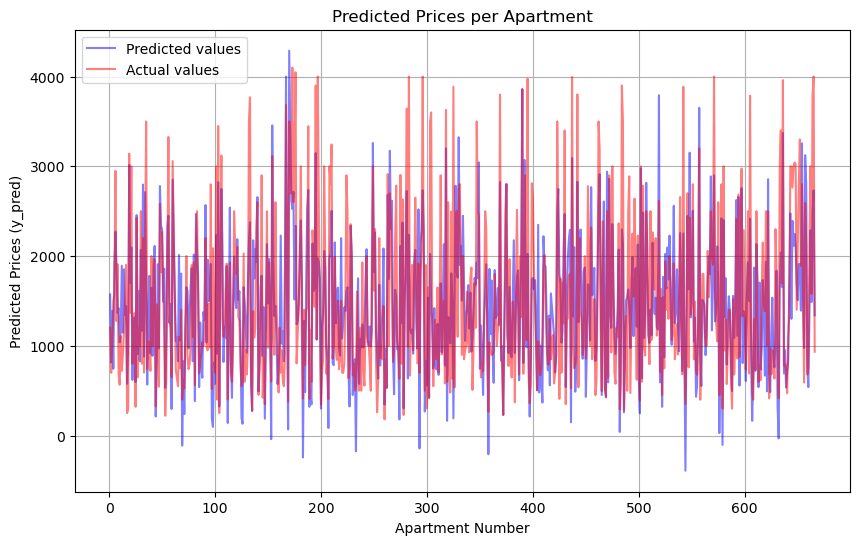

In [16]:
# Plot y_test vs y_pred
plt.figure(figsize=(10, 6))
plt.plot(np.array(range(1, len(y_pred)+1)),y_pred ,alpha=0.5, color='blue', label='Predicted values')
plt.plot(np.array(range(1, len(y_pred)+1)),y_test ,alpha=0.5, color='red', label='Actual values')
plt.xlabel('Apartment Number')
plt.ylabel('Predicted Prices (y_pred)')
plt.title('Predicted Prices per Apartment')
plt.legend()
plt.grid(True)
plt.show()

## Random Forest Regressor

In [17]:
from sklearn.ensemble import RandomForestRegressor

if 'price' not in df.columns:
    raise ValueError("The 'price' column is not in the DataFrame.")

original_shape = df.shape
df = remove_outliers(df, 'price')
print(f"Outliers removed from 'price'. Original shape: {original_shape}, New shape: {df.shape}")

X = df.drop(columns=['price', 'id'])
y = df['price']

datetime_cols = X.select_dtypes(include=['datetime64[ns]']).columns
for col in tqdm(datetime_cols, desc="Processing datetime columns"):
    X[col] = (X[col] - X[col].min()).dt.days

X = pd.get_dummies(X, drop_first=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {np.sqrt(mse):.2f}")
print(f"R-squared (R2): {r2:.2f}")


Outliers removed from 'price'. Original shape: (3328, 360), New shape: (3245, 360)


Processing datetime columns: 100%|██████████| 1/1 [00:00<?, ?it/s]


Mean Squared Error (MSE): 478.52
R-squared (R2): 0.66


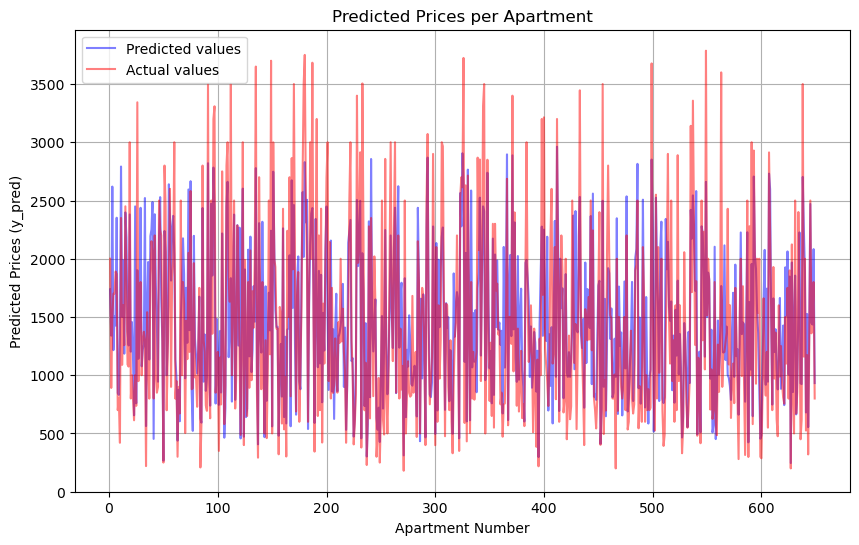

In [18]:
# Plot y_test vs y_pred
plt.figure(figsize=(10, 6))
plt.plot(np.array(range(1, len(y_pred)+1)),y_pred ,alpha=0.5, color='blue', label='Predicted values')
plt.plot(np.array(range(1, len(y_pred)+1)),y_test ,alpha=0.5, color='red', label='Actual values')
plt.xlabel('Apartment Number')
plt.ylabel('Predicted Prices (y_pred)')
plt.title('Predicted Prices per Apartment')
plt.legend()
plt.grid(True)
plt.show()

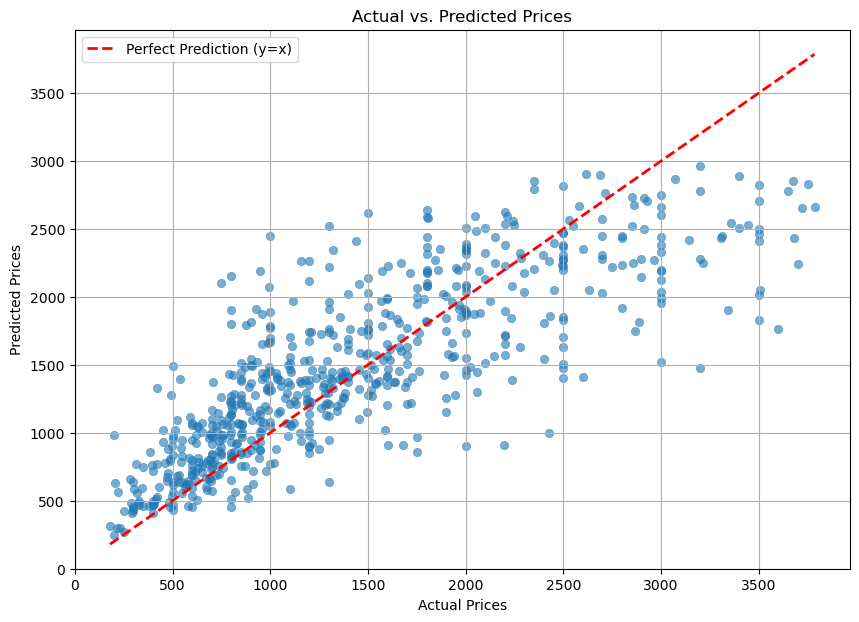

In [19]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6, edgecolor=None)

# Add a line for perfect predictions (y=x)
min_val = min(y_test.min(), y_pred.min())
max_val = max(y_test.max(), y_pred.max())
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', lw=2, label='Perfect Prediction (y=x)')

plt.xlabel("Actual Prices")
plt.ylabel("Predicted Prices")
plt.title("Actual vs. Predicted Prices")
plt.legend()
plt.grid(True)
plt.show()

## LightGBM

In [20]:
# --- FIX: Sanitize feature names for LightGBM ---
print("Sanitizing feature names...")
original_columns = X.columns
new_column_names = []
for col in original_columns:
    # Replace special JSON characters (and other non-alphanumeric except underscore) with an underscore
    new_col = re.sub(r'[^A-Za-z0-9_]+', '_', str(col))
    new_col = re.sub(r'_{2,}', '_', new_col) 
    new_col = new_col.strip('_')  
    if new_col and new_col[0].isdigit():
        new_col = 'col_' + new_col
    if not new_col:
        new_col = f"unnamed_feature_{len(new_column_names)}"
    new_column_names.append(new_col)

X_train.columns = new_column_names
X_test.columns = new_column_names
print("Feature name sanitization complete.")

Sanitizing feature names...
Feature name sanitization complete.


In [21]:
import joblib
import os

X_train_tuned, X_val, y_train_tuned, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42 # 20% of X_train used for validation
)
print(f"\nShape of X_train_tuned: {X_train_tuned.shape}")
print(f"Shape of X_val: {X_val.shape}")


# --- 3. Hyperparameter Tuning with RandomizedSearchCV and Early Stopping ---
print("\nStarting LightGBM hyperparameter tuning with RandomizedSearchCV...")

# Initialize LGBMRegressor with fixed parameters
# n_estimators will be optimized by early stopping, so we set a high initial value.
lgbm = lgb.LGBMRegressor(
    objective='regression',
    metric='rmse',             # Evaluation metric for early stopping
    random_state=42,
    n_jobs=-1,                 # Use all available cores for training
    verbose=-1                 # Suppress verbose output during individual model training
)

# Define the parameter distribution for RandomizedSearchCV
# We use uniform distributions (for continuous parameters) and randint (for integers)
param_dist = {
    'n_estimators': randint(500, 2500),       # Number of trees (boosting rounds), early stopping will optimize this
    'learning_rate': uniform(0.01, 0.1),      # Learning rate (from 0.01 to 0.11)
    'num_leaves': randint(5, 100),           # Maximum number of leaves in one tree (from 20 to 99)
    'max_depth': [-1, 10, 20, 30, 50],            # Maximum tree depth (-1 for no limit, or specific values)
    'min_child_samples': randint(5, 50),      # Minimum number of data needed in a child (leaf)
    'subsample': uniform(0.6, 0.4),           # Subsample ratio of the training instance (e.g., from 0.6 to 1.0)
    'colsample_bytree': uniform(0.6, 0.4),    # Subsample ratio of columns (e.g., from 0.6 to 1.0)
    'reg_alpha': uniform(0.0, 0.5),           # L1 regularization (alpha)
    'reg_lambda': uniform(0.0, 0.5)           # L2 regularization (lambda)
}

# Create a custom scorer for RMSE (Scikit-learn maximizes scores, so we'll use -RMSE)
rmse_scorer = make_scorer(lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred)),
                          greater_is_better=False) # greater_is_better=False indicates that a lower value is better

# Configure RandomizedSearchCV
# n_iter: Number of parameter combinations to try. Since the model is fast, 100-200 is a good starting point.
# cv: Number of folds for cross-validation. We will use 3 folds, in addition to early stopping on the validation set.
n_iter_search = 250 # Number of iterations for the search

random_search = RandomizedSearchCV(
    estimator=lgbm,
    param_distributions=param_dist,
    n_iter=n_iter_search,
    scoring=rmse_scorer,      # The defined scorer for RMSE
    cv=3,                     # 3-fold cross-validation
    verbose=5,                # Show search progress
    random_state=42,
    n_jobs=-1                 # Use all cores to parallelize search iterations
)

# Parameters to pass to the .fit() method of the LGBMRegressor model
# Here we specify the validation set and callbacks for early stopping.
fit_params = {
    "eval_set": [(X_val, y_val)],
    "eval_metric": "rmse",
    "callbacks": [lgb.early_stopping(100, verbose=False)] # Stop if validation metric does not improve for 100 rounds
}

# Execute the search

model_filename = '../models/best_lgbm_model.joblib'


if os.path.exists(model_filename):
    try:
        best_lgbm_model = joblib.load(model_filename)
        print("'best_lgbm_model' loaded from disk, non need to re-train it.")
    except Exception as e:
        print(f"Errore during model loading from disk: {e}")

else:
    random_search.fit(X_train_tuned, y_train_tuned, **fit_params)
    


print("\nHyperparameter tuning complete.")
try:
    print(f"Best parameters found: {random_search.best_params_}")
    y_pred = best_lgbm_model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    print(f"Best RMSE on validation set (during tuning): {rmse:.4f}")
    
except Exception as e:
    print(f"Best parameters found: {best_lgbm_model.get_params()}")
    
# best_score_ is -RMSE, so we negate it to get the actual RMSE value


# --- 4. Using the Best Model Found ---
# random_search.best_estimator_ contains the LGBMRegressor model trained
# with the best hyperparameters and the number of n_estimators determined by early stopping.
if best_lgbm_model is None:
    best_lgbm_model = random_search.best_estimator_

print("\nUsing the best model for final predictions...")
# --- 5. Make Predictions ---
y_pred_gbm = best_lgbm_model.predict(X_test)
print("Predictions complete.")

# --- 6. Calculate RMSE on the Test Set ---
mse_gbm = mean_squared_error(y_test, y_pred_gbm)
rmse_gbm = np.sqrt(mse_gbm)
print(f"\nLightGBM Root Mean Squared Error (RMSE) on test set: {rmse_gbm:.2f}")


Shape of X_train_tuned: (2076, 487)
Shape of X_val: (520, 487)

Starting LightGBM hyperparameter tuning with RandomizedSearchCV...
'best_lgbm_model' loaded from disk, non need to re-train it.

Hyperparameter tuning complete.
Best parameters found: {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 0.6288337343994693, 'importance_type': 'split', 'learning_rate': 0.01712567277652586, 'max_depth': -1, 'min_child_samples': 9, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 647, 'n_jobs': -1, 'num_leaves': 25, 'objective': 'regression', 'random_state': 42, 'reg_alpha': 0.19379761574138477, 'reg_lambda': 0.23097346833547788, 'subsample': 0.9966353635481096, 'subsample_for_bin': 200000, 'subsample_freq': 0, 'metric': 'rmse', 'verbose': -1}

Using the best model for final predictions...
Predictions complete.

LightGBM Root Mean Squared Error (RMSE) on test set: 446.53


In [22]:
# Saving the model for future use without needing of re-training it or repeting the search for best hyperparameters

model_filename = '../models/best_lgbm_model.joblib'
joblib.dump(best_lgbm_model, model_filename)
print(f"\nModel saved successfully as {model_filename}")



Model saved successfully as ../models/best_lgbm_model.joblib


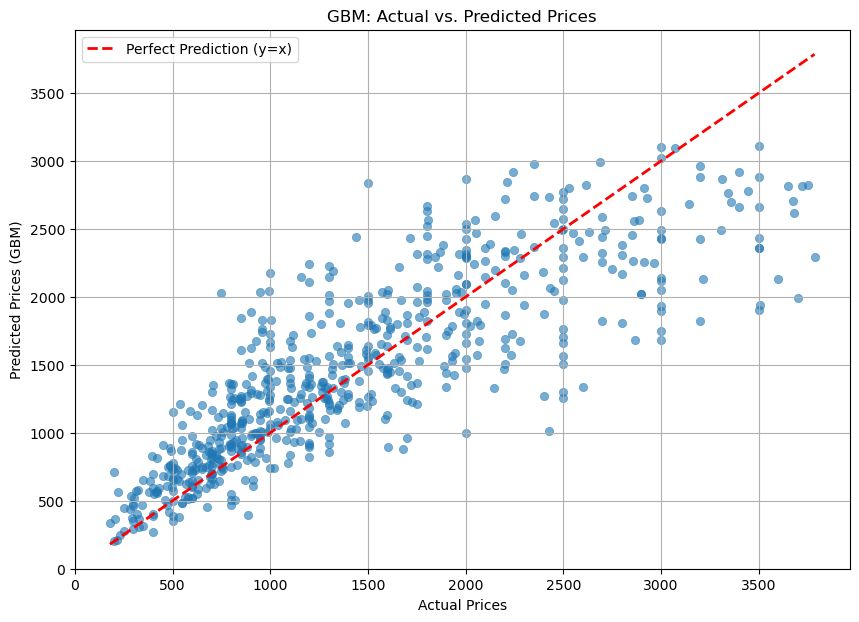

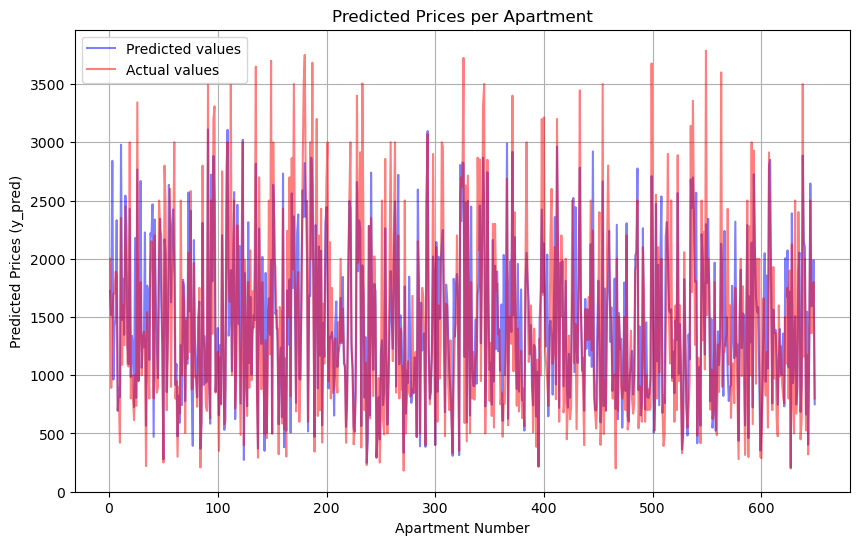

In [23]:
# --- 4. Data Visualization of Predictions ---

# a. Scatter Plot: Actual vs. Predicted Values
plt.figure(figsize=(10, 7))
sns.scatterplot(x=y_test, y=y_pred_gbm, alpha=0.6, edgecolor=None)
min_val_gbm = min(y_test.min(), y_pred_gbm.min())
max_val_gbm = max(y_test.max(), y_pred_gbm.max())
plt.plot([min_val_gbm, max_val_gbm], [min_val_gbm, max_val_gbm], color='red', linestyle='--', lw=2, label='Perfect Prediction (y=x)')
plt.xlabel("Actual Prices")
plt.ylabel("Predicted Prices (GBM)")
plt.title("GBM: Actual vs. Predicted Prices")
plt.legend()
plt.grid(True)
plt.show()

# Plot y_test vs y_pred
plt.figure(figsize=(10, 6))
plt.plot(np.array(range(1, len(y_pred_gbm)+1)),y_pred_gbm ,alpha=0.5, color='blue', label='Predicted values')
plt.plot(np.array(range(1, len(y_pred_gbm)+1)),y_test ,alpha=0.5, color='red', label='Actual values')
plt.xlabel('Apartment Number')
plt.ylabel('Predicted Prices (y_pred)')
plt.title('Predicted Prices per Apartment')
plt.legend()
plt.grid(True)
plt.show()

## Competitive Analysis

In [24]:
# --- 1. Identify "Top" Listings (Criteria: Rating in top 25% OR (High Price AND Low Availability)) ---
# Define "top" listings based on Review Score in top 25% OR (Price in top 25% AND Availability_365 in bottom 25%).

#restoring amenities_list column in df + name/desc
df['amenities_list'] = amenities_list
df['name'] = name_col
df['description'] = description_col

# Calculate quantile thresholds for the entire dataset
# Top 25% for Rating (Higher is better) -> 75th percentile
rating_75th_percentile = df['review_scores_rating'].quantile(0.75)
# Top 25% for Price (Higher is better) -> 75th percentile
price_75th_percentile = df['price'].quantile(0.75)
# Bottom 25% for Availability_365 (Lower is better for booking signal) -> 25th percentile
availability_25th_percentile = df['availability_365'].quantile(0.25)

# Condition 1: Review score in the top 25% (>= 75th percentile)
condition_top_rating = df['review_scores_rating'] >= rating_75th_percentile

# Condition 2: High Price (>= 75th percentile) AND Low Availability (<= 25th percentile)
condition_high_price = df['price'] >= price_75th_percentile
condition_low_availability = df['availability_365'] <= availability_25th_percentile
condition_high_price_low_availability = condition_high_price & condition_low_availability

# Combine conditions: Top if (Top Rating) OR (High Price AND Low Availability)
df['is_top'] = condition_top_rating | condition_high_price_low_availability

# Create DataFrames for top listings and all listings for comparison
df_top = df[df['is_top']].copy()
df_all = df.copy() # Keep df_all as the reference for comparison

print("--- Identifying Top Listings ---")
print(f"Criteria: (Review Score >= {rating_75th_percentile:.2f} ({0.75*100}th percentile))")
print(f"          OR (Price >= {price_75th_percentile:.2f} ({0.75*100}th percentile) AND Availability_365 <= {availability_25th_percentile:.2f} ({0.25*100}th percentile))")

print(f"Total number of listings: {len(df_all)}")
print(f"Number of listings considered 'top': {len(df_top)}")
print(f"Percentage of 'top' listings: {(len(df_top) / len(df_all)) * 100:.2f}%")

--- Identifying Top Listings ---
Criteria: (Review Score >= 5.00 (75.0th percentile))
          OR (Price >= 1950.00 (75.0th percentile) AND Availability_365 <= 82.00 (25.0th percentile))
Total number of listings: 3245
Number of listings considered 'top': 997
Percentage of 'top' listings: 30.72%


In [25]:
import pandas as pd
from collections import Counter
# Assuming df_all and df_top are already defined and loaded with your data
# Assuming amenities_list column in df_all and df_top contains actual Python lists

# --- 2. Amenities Analysis ---
# Analyze common amenities in "top" listings vs. average.
# Use the 'amenities_list' column from your DF structure.

# We no longer need the parse_amenities function if the column already contains actual Python lists.
# Your debug print confirms it: df_top['amenities_list'] contains actual lists like [Washer, TV, ...]

print("\n--- Amenities Frequency Analysis ---")
print("Sample of df_top['amenities_list'] before flattening:")
print(df_top['amenities_list'][:3]) # Keep this for debugging confirmation

# Apply the function to get lists of amenities
# Since 'amenities_list' already contains lists, we just need to flatten them.
# The .sum() method on a Series of lists concatenates all those lists into a single flat list.
all_amenities_list = df_all['amenities_list'].sum()
top_amenities_list = df_top['amenities_list'].sum()

# Count frequencies
all_amenities_counts = Counter(all_amenities_list)
top_amenities_counts = Counter(top_amenities_list)

print(f"\nTotal unique amenities (all listings): {len(all_amenities_counts)}")
print(f"Total unique amenities (top listings): {len(top_amenities_counts)}")

# Convert to DataFrame for easy comparison
amenities_df = pd.DataFrame({
    'All': all_amenities_counts,
    'Top': top_amenities_counts
}).fillna(0).astype(int)

# Calculate percentage frequency
amenities_df['All_Pct'] = amenities_df['All'] / len(df_all) * 100
amenities_df['Top_Pct'] = amenities_df['Top'] / len(df_top) * 100

# Calculate the frequency ratio (Top Pct / All Pct)
# Add a small value to avoid division by zero if an amenity doesn't appear in "All"
amenities_df['Ratio'] = amenities_df['Top_Pct'] / (amenities_df['All_Pct'] + 1e-6)

# Sort by Ratio to see which amenities are disproportionately common in top listings
amenities_df_sorted_ratio = amenities_df.sort_values('Ratio', ascending=False)

# Sort by total frequency to see the most common amenities overall
amenities_df_sorted_all_freq = amenities_df.sort_values('All', ascending=False)

print("\nTop 10 Amenities by Ratio (more common in 'top' vs. 'all'):")
print(amenities_df_sorted_ratio.head(10))

# The remaining print statements for common amenities are assumed to follow.


--- Amenities Frequency Analysis ---
Sample of df_top['amenities_list'] before flattening:
4     [Washer, TV with standard cable, Dedicated wor...
19    [Washer, Hair dryer, Hangers, Clothing storage...
25    [First aid kit, Wine glasses, Hangers, Private...
Name: amenities_list, dtype: object

Total unique amenities (all listings): 1224
Total unique amenities (top listings): 723

Top 10 Amenities by Ratio (more common in 'top' vs. 'all'):
                                                    All  Top  All_Pct  \
Baby monitor - always at the listing                  3    3    0.092   
Children’s books and toys for ages 2-5 years ol...    3    3    0.092   
Booster seat high chair - available upon request      3    3    0.092   
Bosch single oven                                     2    2    0.062   
60 inch HDTV with Netflix                             2    2    0.062   
HDTV with Amazon Prime Video, Apple TV, Disney+...    2    2    0.062   
Shared BBQ grill: wood-burning              

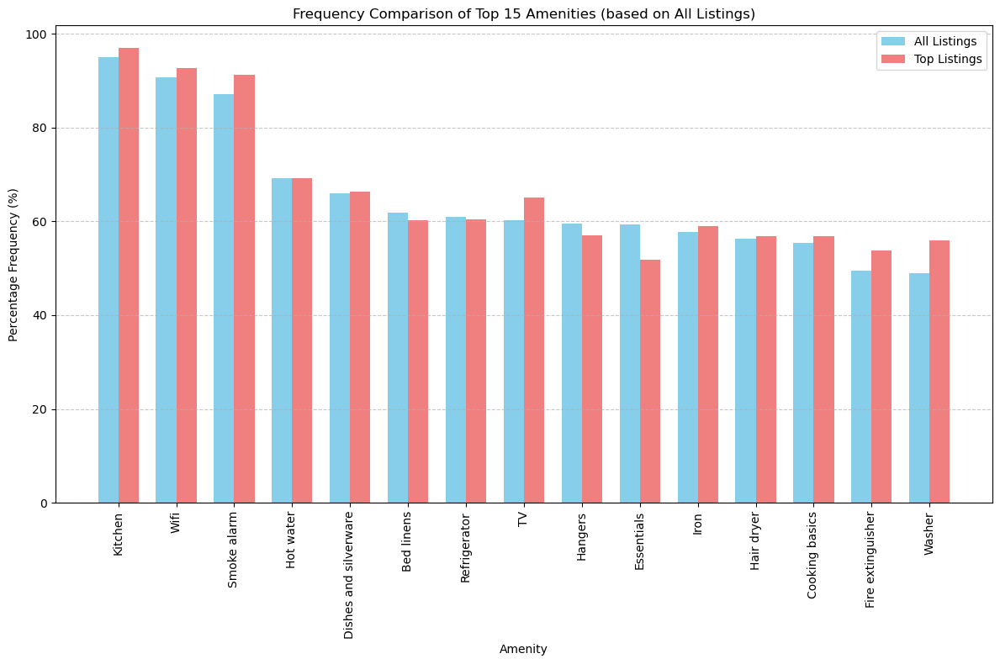

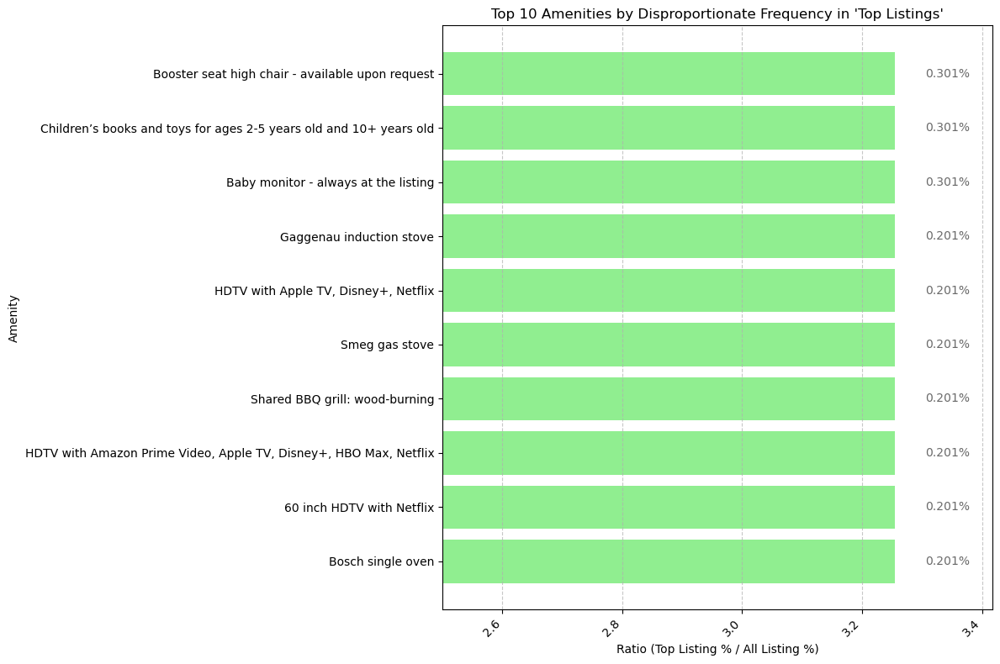


--- 'minimum_nights' Analysis ---
Descriptive Statistics (All Listings):
count   3245.000
mean       7.349
std       25.863
min        1.000
25%        1.000
50%        3.000
75%        4.000
max      500.000
Name: minimum_nights, dtype: float64

Descriptive Statistics (Top Listings):
count   997.000
mean      6.862
std      24.384
min       1.000
25%       2.000
50%       3.000
75%       5.000
max     500.000
Name: minimum_nights, dtype: float64


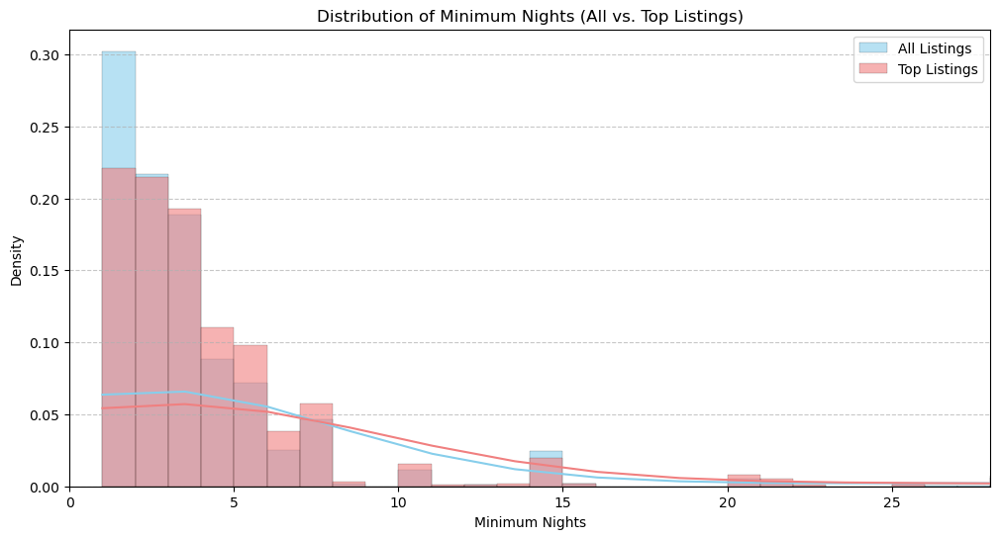


Top 5 Most Common 'minimum_nights' (All Listings):
minimum_nights
1    933
2    670
3    582
4    274
5    222
Name: count, dtype: int64

Top 5 Most Common 'minimum_nights' (Top Listings):
minimum_nights
1    212
2    206
3    185
4    106
5     94
Name: count, dtype: int64


In [26]:
# Assuming df_all and df_top are already defined from previous cells
# And amenities_df_sorted_ratio, amenities_df_sorted_all_freq are available

# --- Data Viz: Amenities Frequency Comparison (Top N most common in 'All') ---
N_AMENITIES_PLOT = 15 # Number of amenities to visualize

amenities_to_plot_all_freq = amenities_df_sorted_all_freq.head(N_AMENITIES_PLOT).index

plt.figure(figsize=(12, 8))
bar_width = 0.35
index = np.arange(len(amenities_to_plot_all_freq))

plt.bar(index, amenities_df.loc[amenities_to_plot_all_freq, 'All_Pct'], bar_width, label='All Listings', color='skyblue')
plt.bar(index + bar_width, amenities_df.loc[amenities_to_plot_all_freq, 'Top_Pct'], bar_width, label='Top Listings', color='lightcoral')

plt.xlabel("Amenity")
plt.ylabel("Percentage Frequency (%)")
plt.title(f"Frequency Comparison of Top {N_AMENITIES_PLOT} Amenities (based on All Listings)")
plt.xticks(index + bar_width / 2, amenities_to_plot_all_freq, rotation=90)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# NEW GRAPH: Top 10 Amenities by Ratio - Zoom on X-axis with Top_Pct as text

N_RATIO_PLOT = 10 # Number of amenities to visualize

# Get the amenities that are disproportionately more common in 'top' listings
amenities_to_plot_ratio = amenities_df_sorted_ratio.head(N_RATIO_PLOT).index
# Filter the DataFrame to only these amenities
plot_data_ratio = amenities_df.loc[amenities_to_plot_ratio].sort_values('Ratio', ascending=True) # Sort ascending for bar plot from bottom up

plt.figure(figsize=(12, 8)) # Keeping original figsize

bars = plt.barh(plot_data_ratio.index, plot_data_ratio['Ratio'], color='lightgreen') # Assign the bars to a variable
plt.xlabel("Ratio (Top Listing % / All Listing %)")
plt.ylabel("Amenity")
plt.title(f"Top {N_RATIO_PLOT} Amenities by Disproportionate Frequency in 'Top Listings'")

plt.xlim(left=2.5) # Start X-axis from 2.5

plt.xticks(rotation=45, ha='right') # Rotate x-axis labels if needed
plt.grid(axis='x', linestyle='--', alpha=0.7)

# --- CORREZIONE QUI: Usa enumerate per ottenere l'indice direttamente ---
for i, bar in enumerate(bars): # <--- Modifica qui!
    # Get the value for the Ratio (x-coordinate of the end of the bar)
    xval = bar.get_width() 
    # Use the 'i' from enumerate as the direct index
    amenity_name = plot_data_ratio.index[i] # <--- Modifica qui!
    top_pct_val = plot_data_ratio.loc[amenity_name, 'Top_Pct']
    
    # Add the text label slightly to the right of the bar's end
    plt.text(xval + 0.05,  # x position: slightly right of the bar's end
             bar.get_y() + bar.get_height()/2, # y position: middle of the bar
             f'{top_pct_val:.3f}%', # Text to display: Top_Pct formatted to 1 decimal place
             va='center', # Vertical alignment: center
             ha='left',   # Horizontal alignment: left (moves text to the right of xval)
             color='dimgray',
             fontsize=10)

plt.tight_layout()
plt.show()


# --- 3. Minimum Nights Analysis ---
print("\n--- 'minimum_nights' Analysis ---")

print("Descriptive Statistics (All Listings):")
print(df_all['minimum_nights'].describe())

print("\nDescriptive Statistics (Top Listings):")
print(df_top['minimum_nights'].describe())


# --- Data Viz: Minimum Nights Distribution (Adjusted) ---

plt.figure(figsize=(12, 6))

# Define bins explicitly for integer values for better clarity
# max_nights_display as before, for consistency in x-axis limit
max_nights_display = min(df_all['minimum_nights'].quantile(0.95), 60)
# Create bins for each integer night up to max_nights_display
bins_for_nights = np.arange(1, max_nights_display + 2, 1) # +2 to include the max_nights_display value itself

# Histogram for all listings
sns.histplot(df_all['minimum_nights'], bins=bins_for_nights, kde=True, color='skyblue', label='All Listings', stat='density', common_norm=False, alpha=0.6)

# Histogram for top listings - added alpha for transparency
sns.histplot(df_top['minimum_nights'], bins=bins_for_nights, kde=True, color='lightcoral', label='Top Listings', stat='density', common_norm=False, alpha=0.6)

plt.xlabel("Minimum Nights")
plt.ylabel("Density")
plt.title("Distribution of Minimum Nights (All vs. Top Listings)")
plt.legend()
plt.xlim(0, max_nights_display) # Keep x-axis limit consistent
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Also compare the most common minimum nights
print("\nTop 5 Most Common 'minimum_nights' (All Listings):")
print(df_all['minimum_nights'].value_counts().head())

print("\nTop 5 Most Common 'minimum_nights' (Top Listings):")
print(df_top['minimum_nights'].value_counts().head())

In [27]:
# --- 4. Text Analysis (Keywords from Name and Description) ---
print("\n--- Text Analysis (Keywords from Name and Description) ---")

# Combine name and description into a single text column
# Ensure columns are not NaN (handled in initial cleaning assumption)
df_all['text'] = df_all['name'].fillna('') + ' ' + df_all['description'].fillna('')
df_top['text'] = df_top['name'].fillna('') + ' ' + df_top['description'].fillna('')


# Clean the text
STOPWORDS_EN = set(stopwords.words('english')) # Use English stopwords
# You can add context-specific stopwords if needed (e.g., "apartment", "room", city name, etc.)
STOPWORDS_EN.update(['br', 'apartment', 'stockholm', 'city', 'room']) # not intresting but very common words

def clean_text(text):
    """Cleans text: lowercase, removes punctuation, tokenizes, removes stop words."""
    if pd.isna(text):
        return "" # Handle potential NaNs just in case, although already dropped earlier
    text = text.lower()
    # Remove punctuation and symbols (keep spaces and alphanumeric)
    text = re.sub(r'[^a-z0-9\s]', '', text)
    tokens = word_tokenize(text)
    # Remove stop words and very short words (length < 2)
    tokens = [word for word in tokens if word not in STOPWORDS_EN and len(word) > 1]
    return tokens

# Apply cleaning
all_words_list = df_all['text'].apply(clean_text).sum()
top_words_list = df_top['text'].apply(clean_text).sum()

# Count frequencies
all_words_counts = Counter(all_words_list)
top_words_counts = Counter(top_words_list)

print(f"Total unique words (all listings): {len(all_words_counts)}")
print(f"Total unique words (top listings): {len(top_words_counts)}")


# Convert to DataFrame for comparison
words_df = pd.DataFrame({
    'All': all_words_counts,
    'Top': top_words_counts
}).fillna(0).astype(int)

# Calculate percentage frequency (based on total number of words in each corpus)
total_words_all = sum(all_words_counts.values())
total_words_top = sum(top_words_counts.values())

words_df['All_Pct'] = words_df['All'] / total_words_all * 100
words_df['Top_Pct'] = words_df['Top'] / total_words_top * 100

# Calculate the frequency ratio (Top Pct / All Pct)
# Add a small value to avoid division by zero if a word doesn't appear in "All"
words_df['Ratio'] = words_df['Top_Pct'] / (words_df['All_Pct'] + 1e-9)

# Sort by Ratio to see which words are disproportionately common in top listings
words_df_sorted_ratio = words_df.sort_values('Ratio', ascending=False)

# Filter words with low total frequency to avoid rare words with disproportionately high ratios
min_freq_all = 10 # Word must appear at least 10 times in all listings (adjust as needed)
words_df_sorted_ratio_filtered = words_df_sorted_ratio[words_df_sorted_ratio['All'] >= min_freq_all].copy()


print(f"\nTop 10 Words by Ratio (more common in 'top' vs. 'all', min freq in 'All'):")
print(words_df_sorted_ratio_filtered.head(10))

print("\nTop 10 Most Common Words overall ('all'):")
print(words_df.sort_values('All', ascending=False).head(10))


--- Text Analysis (Keywords from Name and Description) ---
Total unique words (all listings): 8251
Total unique words (top listings): 4644

Top 10 Words by Ratio (more common in 'top' vs. 'all', min freq in 'All'):
           All  Top  All_Pct  Top_Pct  Ratio
skndal      10    8    0.009    0.021  2.489
tennis      13   10    0.011    0.027  2.393
sdermalms   21   16    0.018    0.043  2.370
month       20   15    0.017    0.040  2.333
beams       12    9    0.010    0.024  2.333
bicycles    11    8    0.009    0.021  2.263
heritage    11    8    0.009    0.021  2.263
week        17   12    0.015    0.032  2.196
fruit       10    7    0.009    0.019  2.178
swedens     10    7    0.009    0.019  2.178

Top 10 Most Common Words overall ('all'):
              All  Top  All_Pct  Top_Pct  Ratio
close        1301  418    1.113    1.112  1.000
minutes      1190  452    1.018    1.203  1.182
bed          1146  318    0.980    0.846  0.863
located      1116  347    0.955    0.923  0.967
kitche

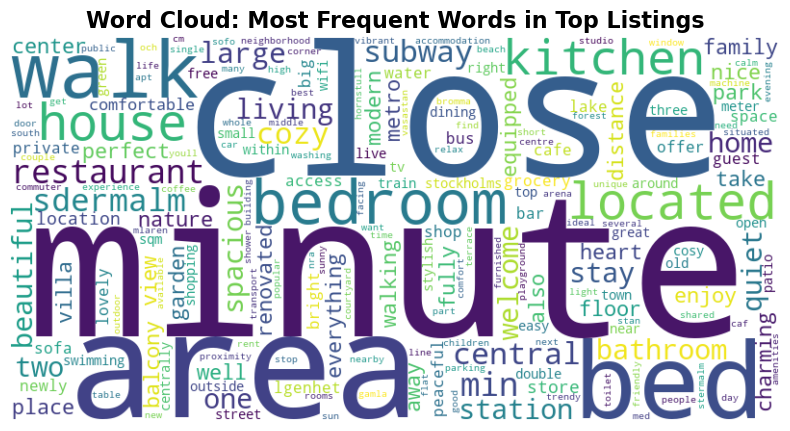

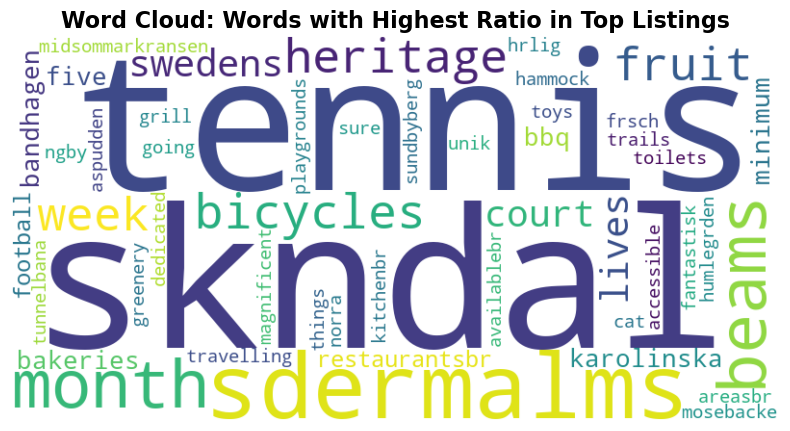

In [28]:
# --- Data Viz: Word Cloud for Top Listings (Most Frequent) ---

# Generate a text string for the word cloud from TOP listings
# Use the cleaned tokens from top_words_list
top_text_combined_cleaned = " ".join(top_words_list) 

# Create the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white',
                      stopwords=STOPWORDS_EN, collocations=False).generate(top_text_combined_cleaned)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off") # Hide axes
# Make the title larger and bold, reflecting the change
plt.title("Word Cloud: Most Frequent Words in Top Listings", fontsize=16, fontweight='bold') 
plt.show()

# Add separation between the word clouds
print("\n\n") # Adds two newlines for separation, adjust as needed

# Optional: Word cloud based on words with a high Ratio (filtered list)

# We are no longer generating a text string by repeating words.
# We will create a dictionary where keys are words and values are their Ratios.

# Select the top N words from words_df_sorted_ratio_filtered
# For example, the first 50 or 100 words that have a high Ratio.
N_WORDS_RATIO_CLOUD = 50 # You can adjust this number
top_ratio_words_df = words_df_sorted_ratio_filtered.head(N_WORDS_RATIO_CLOUD)

# Create a dictionary {word: ratio_value}
# Ensure ratio values are positive and non-zero, if any (already handled by 1e-9)
# You might want to normalize or scale the ratios if they are very small or very large
word_ratios_dict = top_ratio_words_df['Ratio'].to_dict()

# Create the word cloud using frequencies from the dictionary
# WordCloud has a `prefer_horizontal` parameter that can be useful
wordcloud_ratio = WordCloud(width=800, height=400, background_color='white',
                            stopwords=STOPWORDS_EN, collocations=False,
                            prefer_horizontal=0.9 # Makes words more horizontal
                           ).generate_from_frequencies(word_ratios_dict)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_ratio, interpolation='bilinear')
plt.axis("off")
# Make the title larger and bold
plt.title("Word Cloud: Words with Highest Ratio in Top Listings", fontsize=16, fontweight='bold')
plt.show()